In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/hamza_1/keras/default/1/best_model.keras
/kaggle/input/breast-ultrasound-images-dataset/Dataset_BUSI_with_GT/benign/benign (2).png
/kaggle/input/breast-ultrasound-images-dataset/Dataset_BUSI_with_GT/benign/benign (285).png
/kaggle/input/breast-ultrasound-images-dataset/Dataset_BUSI_with_GT/benign/benign (166)_mask.png
/kaggle/input/breast-ultrasound-images-dataset/Dataset_BUSI_with_GT/benign/benign (290)_mask.png
/kaggle/input/breast-ultrasound-images-dataset/Dataset_BUSI_with_GT/benign/benign (300).png
/kaggle/input/breast-ultrasound-images-dataset/Dataset_BUSI_with_GT/benign/benign (390).png
/kaggle/input/breast-ultrasound-images-dataset/Dataset_BUSI_with_GT/benign/benign (357).png
/kaggle/input/breast-ultrasound-images-dataset/Dataset_BUSI_with_GT/benign/benign (430)_mask.png
/kaggle/input/breast-ultrasound-images-dataset/Dataset_BUSI_with_GT/benign/benign (89)_mask.png
/kaggle/input/breast-ultrasound-images-dataset/Dataset_BUSI_with_GT/benign/benign (261)_mask.png
/ka

In [2]:
import tensorflow as tf
import matplotlib.pyplot as plt
from tensorflow.keras.layers import *
import seaborn as sns
from tensorflow.keras.utils import img_to_array, load_img
from glob import glob
import os
import shutil
from sklearn.model_selection import train_test_split 
import matplotlib.pyplot as plt
from tensorflow.keras.metrics import MeanIoU
import cv2

In [3]:
base_dir = "/kaggle/input/breast-ultrasound-images-dataset/Dataset_BUSI_with_GT"
print("total number of folder and types",os.listdir(base_dir))
print("--"*40)
print("total number of folder and types",len(os.listdir(base_dir)))

total number of folder and types ['benign', 'normal', 'malignant']
--------------------------------------------------------------------------------
total number of folder and types 3


Total number of files in benign: 891
Total number of files in normal: 266
Total number of files in malignant: 421


/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1765: FutureWarning: unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.
  order = pd.unique(vector)


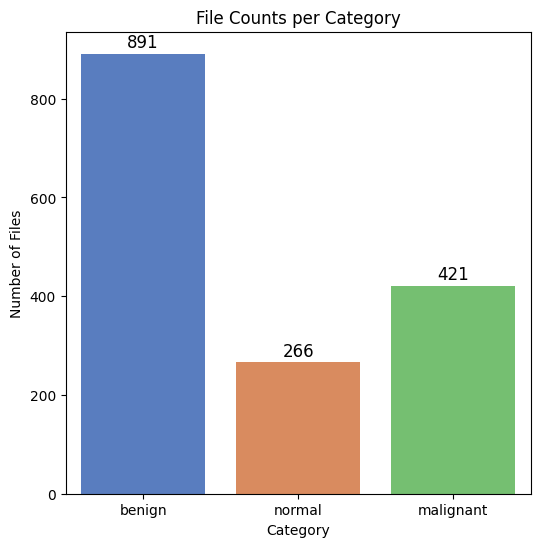

In [4]:
# Data collection
categories = []
counts = []
for folder in os.listdir(base_dir):
    folder_path = os.path.join(base_dir, folder)
    if os.path.isdir(folder_path):  # Check if it is a directory
        try:
            files_in_folder = [f for f in os.listdir(folder_path) if os.path.isfile(os.path.join(folder_path, f))]
            num_files = len(files_in_folder)

            categories.append(folder)  # Store folder name as a category
            counts.append(num_files)   # Store the file count

            print(f"Total number of files in {folder}: {num_files}")

        except OSError as e:
            print(f"Error accessing {folder}: {e}")

# Create the countplot
plt.figure(figsize=(6, 6))
ax=sns.barplot(x=categories, y=counts, palette="muted")
# Add annotations
for i, count in enumerate(counts):
    plt.text(i, count + 5, str(count), ha="center",
             va="bottom", fontsize=12, color="black")

# Add titles and labels
plt.title("File Counts per Category")
plt.xlabel("Category")
plt.ylabel("Number of Files")

# Show the plot
plt.show()


In [5]:
def check_shape_and_min_max(file_path):
    image = load_img(file_path) #Tensorflow 
    image_array = img_to_array(image) 
    shape_img = image_array.shape
    # Calculate min and max pixel values
    min_val = np.min(image_array)
    max_val = np.max(image_array)
    return shape_img, min_val, max_val


# Loop through folders in base directory
for folder in os.listdir(base_dir):
    folder_path = os.path.join(base_dir, folder)
        
    image_count = 0  # Counter to limit the number of images processed
    
    print(f"Processing folder: {folder}")
    
    # Loop on the files in the folder
    for file_name in os.listdir(folder_path):
        file_path = os.path.join(folder_path, file_name)

        # Check if the file is a valid image file
        if os.path.isfile(file_path) and file_name.lower().endswith('.png'):
            shape, min_val, max_val = check_shape_and_min_max(file_path)  # Call the function
            print(f"Image: {file_name}, Shape: {shape}, Min: {min_val}, Max: {max_val}")
            
            image_count += 1  # Increment the count

            if image_count >= 10:  # Limit to the first 10 images
                break


Processing folder: benign
Image: benign (2).png, Shape: (473, 557, 3), Min: 0.0, Max: 255.0
Image: benign (285).png, Shape: (494, 625, 3), Min: 0.0, Max: 255.0
Image: benign (166)_mask.png, Shape: (471, 555, 3), Min: 0.0, Max: 255.0
Image: benign (290)_mask.png, Shape: (389, 465, 3), Min: 0.0, Max: 255.0
Image: benign (300).png, Shape: (387, 463, 3), Min: 0.0, Max: 255.0
Image: benign (390).png, Shape: (583, 779, 3), Min: 0.0, Max: 255.0
Image: benign (357).png, Shape: (429, 581, 3), Min: 0.0, Max: 240.0
Image: benign (430)_mask.png, Shape: (581, 768, 3), Min: 0.0, Max: 255.0
Image: benign (89)_mask.png, Shape: (576, 893, 3), Min: 0.0, Max: 255.0
Image: benign (261)_mask.png, Shape: (386, 469, 3), Min: 0.0, Max: 255.0
Processing folder: normal
Image: normal (28).png, Shape: (619, 761, 3), Min: 0.0, Max: 255.0
Image: normal (51).png, Shape: (490, 554, 3), Min: 0.0, Max: 255.0
Image: normal (74).png, Shape: (467, 558, 3), Min: 0.0, Max: 255.0
Image: normal (45).png, Shape: (601, 767, 3),

In [6]:
def check_shape(file_path):
    image = load_img(file_path) #load img using tf
    image_array = img_to_array(image) #convert to array
    shape_img = image_array.shape
    return shape_img


for folder in os.listdir(base_dir):
    folder_path = os.path.join(base_dir, folder)
        
    image_count = 0  # Counter to limit the number of images processed
    
    # loop on the files in the folder
    for file_name in os.listdir(folder_path):
        file_path = os.path.join(folder_path, file_name)

        # Check if the file is a valid image file
        if os.path.isfile(file_path) and file_name.lower().endswith('.png'):
            shape = check_shape(file_path)  # Call the check_shape function
            print(f"Image: {file_name}, Shape: {shape}")
            image_count += 1  # Increment the count

            if image_count >= 10:  
                break

Image: benign (2).png, Shape: (473, 557, 3)
Image: benign (285).png, Shape: (494, 625, 3)
Image: benign (166)_mask.png, Shape: (471, 555, 3)
Image: benign (290)_mask.png, Shape: (389, 465, 3)
Image: benign (300).png, Shape: (387, 463, 3)
Image: benign (390).png, Shape: (583, 779, 3)
Image: benign (357).png, Shape: (429, 581, 3)
Image: benign (430)_mask.png, Shape: (581, 768, 3)
Image: benign (89)_mask.png, Shape: (576, 893, 3)
Image: benign (261)_mask.png, Shape: (386, 469, 3)
Image: normal (28).png, Shape: (619, 761, 3)
Image: normal (51).png, Shape: (490, 554, 3)
Image: normal (74).png, Shape: (467, 558, 3)
Image: normal (45).png, Shape: (601, 767, 3)
Image: normal (68)_mask.png, Shape: (488, 558, 3)
Image: normal (56)_mask.png, Shape: (598, 763, 3)
Image: normal (41)_mask.png, Shape: (600, 761, 3)
Image: normal (122)_mask.png, Shape: (578, 766, 3)
Image: normal (16)_mask.png, Shape: (464, 566, 3)
Image: normal (50).png, Shape: (310, 392, 3)
Image: malignant (71).png, Shape: (592, 52

The images within the dataset exhibit inconsistent dimensions (height and width). Specifically, the shapes of the images vary, as demonstrated by the provided examples. While all images appear to have three color channels (RGB), indicated by the final '3' in the shape tuples, the height and width dimensions are not uniform.


The dataset contains images with varying dimensions. The table below shows a few examples:

| Image Name        | Shape        |
|-------------------|--------------|
| benign (2).png    | (473, 557, 3) |
| benign (285).png  | (494, 625, 3) |
| normal (28).png    | (619, 761 3) |
| malignant (71).png | (592, 528, 3) |

This inconsistency requires preprocessing (e.g., resizing) to ensure uniform input dimensions for machine learning models.

In [7]:
benign_img ="/kaggle/input/breast-ultrasound-images-dataset/Dataset_BUSI_with_GT/benign/benign (1).png"
benign_mask = "/kaggle/input/breast-ultrasound-images-dataset/Dataset_BUSI_with_GT/benign/benign (1)_mask.png"

In [8]:
malignant_img = "/kaggle/input/breast-ultrasound-images-dataset/Dataset_BUSI_with_GT/malignant/malignant (1).png"
malignant_mask = "/kaggle/input/breast-ultrasound-images-dataset/Dataset_BUSI_with_GT/malignant/malignant (1)_mask.png"

In [9]:
normal_img = "/kaggle/input/breast-ultrasound-images-dataset/Dataset_BUSI_with_GT/normal/normal (1).png"
normal_mask = "/kaggle/input/breast-ultrasound-images-dataset/Dataset_BUSI_with_GT/normal/normal (1)_mask.png"
normal_img_1 ="/kaggle/input/breast-ultrasound-images-dataset/Dataset_BUSI_with_GT/normal/normal (10).png"
normal_mask_1= "/kaggle/input/breast-ultrasound-images-dataset/Dataset_BUSI_with_GT/normal/normal (10)_mask.png"

In [10]:
def visualize_image_mask(image_path, mask_path):
    # Load the image and mask
    image = load_img(image_path) 
    mask = load_img(mask_path)   
    # Convert image to numpy arrays 
    image_array = img_to_array(image).astype("uint8")
    mask_array = img_to_array(mask).astype("uint8")
    # Create a subplot to display image and mask side by side
    plt.figure(figsize=(10, 5))
    
    # Original Image
    plt.subplot(1, 2, 1)
    plt.imshow(image_array)
    plt.title("Original Image")
    plt.axis("off")  # Hide axes
    
    # Mask Image
    plt.subplot(1, 2, 2)
    plt.imshow(mask_array, cmap="gray")  # Display mask in grayscale
    plt.title("Mask Image")
    plt.axis("off")  # Hide axes    
    # Display the plots
    plt.tight_layout()
    plt.show()


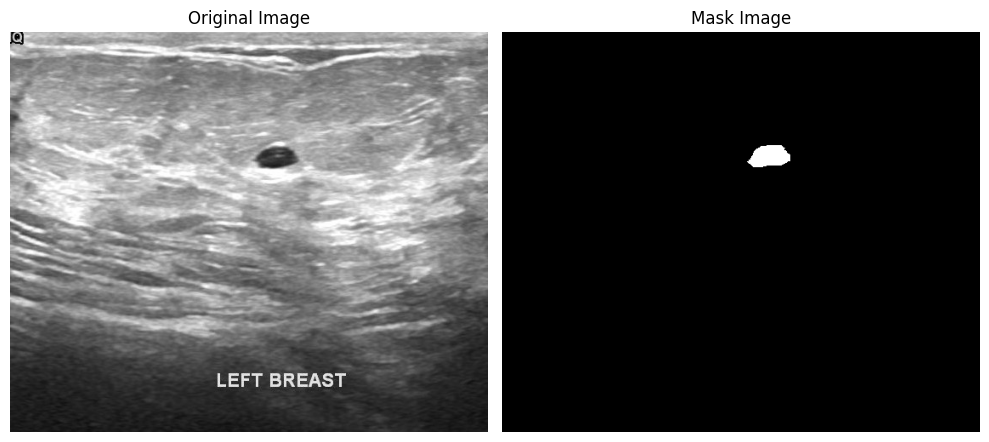

In [11]:
visualize_image_mask(benign_img, benign_mask)

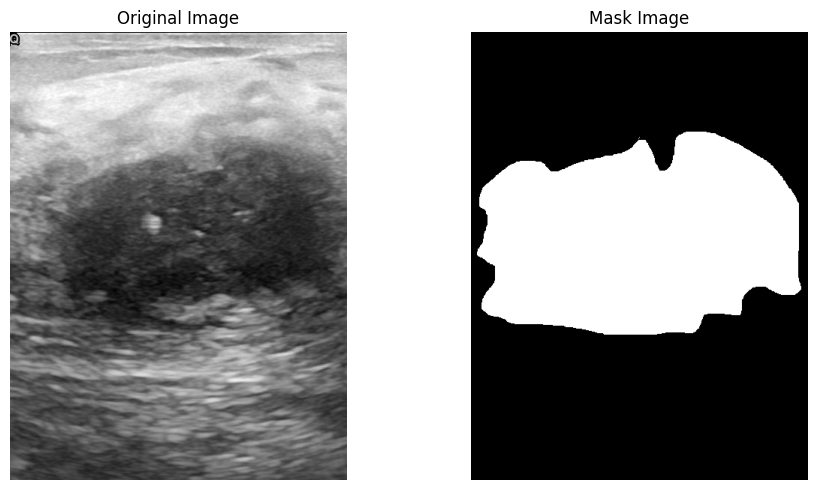

In [12]:
visualize_image_mask(malignant_img, malignant_mask)

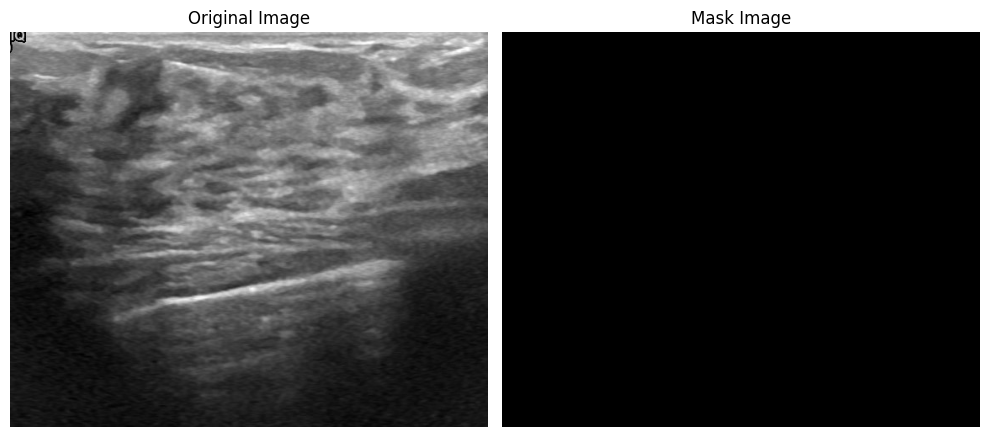

In [13]:
visualize_image_mask(normal_img, normal_mask)

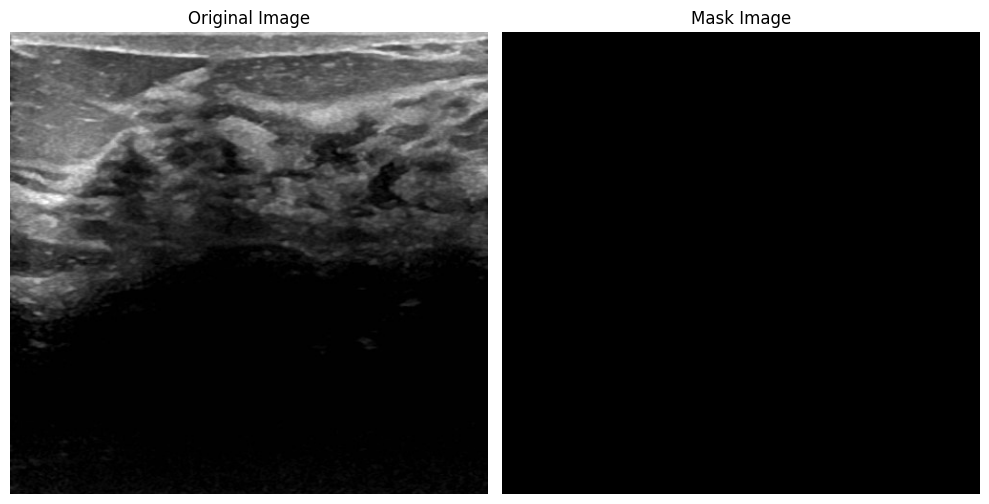

In [14]:
visualize_image_mask(normal_img_1, normal_mask_1)

# Check file extensions 

In [15]:
def check_file_extension(directory_path):
    for file in os.listdir(directory_path):
        file_path = os.path.join(directory_path, file)  
        
        # Check if it is a file 
        if os.path.isfile(file_path):
            if not file.lower().endswith(".png"):  # Ensure case-insensitivity
                raise FileNotFoundError(f"Non-PNG file found: '{file}'")
    
    print("All files in the directory have the '.png' extension.")

benign_cases = "/kaggle/input/breast-ultrasound-images-dataset/Dataset_BUSI_with_GT/benign"

print("Check ==> Benign")
check_file_extension(benign_cases)

Check ==> Benign
All files in the directory have the '.png' extension.


In [16]:
malignant_cases = "/kaggle/input/breast-ultrasound-images-dataset/Dataset_BUSI_with_GT/malignant"

print("Check ==> Malignant")
check_file_extension(malignant_cases)

Check ==> Malignant
All files in the directory have the '.png' extension.


# Preprocessing

In [17]:
root_dir = '/kaggle/input/breast-ultrasound-images-dataset/Dataset_BUSI_with_GT/*/*'

In [18]:

paths = glob(root_dir)

# Initialize counters 
normal_images = 0
normal_masks = 0
benign_images = 0
benign_masks = 0
malignant_images = 0
malignant_masks = 0

# Loop through each file path found by glob.
for path in paths:
    if "normal" in path:  # Check if the path contains "normal".
        if "mask" not in path: # Check if the path does *not* contain "mask" (it's an image).
            normal_images += 1
        else:  # If it contains "mask", it's a mask.
            normal_masks += 1
    elif "benign" in path: #
        if "mask" not in path:
            benign_images += 1
        else:
            benign_masks += 1
    elif "malignant" in path: 
        if "mask" not in path:
            malignant_images += 1
        else:
            malignant_masks += 1

# Calculate the total no. of images and masks across all classes.
total_images = normal_images + benign_images + malignant_images
total_masks = normal_masks + benign_masks + malignant_masks

print(f"'normal' class has {normal_images} images and {normal_masks} masks.")
print(f"'benign' class has {benign_images} images and {benign_masks} masks.")
print(f"'malignant' class has {malignant_images} images and {malignant_masks} masks.")
print(f"\nThere are total of {total_images} images and {total_masks} masks.")

'normal' class has 133 images and 133 masks.
'benign' class has 437 images and 454 masks.
'malignant' class has 210 images and 211 masks.

There are total of 780 images and 798 masks.


In [19]:
def load_image(path, size):
    image = cv2.imread(path)
    image = cv2.resize(image, (size,size))
    image = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)   # shape: (size,size,3) -> (size,size,1)
    image = image/255.0   # normalize
    return image

def load_data(root_path, size):
    images = []
    masks = []
    
    x = 0   # additional variable to identify images consisting of 2 or more masks
    
    for path in sorted(glob(root_path)):
        img = load_image(path, size)   # read mask or image
            
        if 'mask' in path:
            if x:   # this image has masks more than one
                masks[-1] += img   # add the mask to the last mask
                    
                # When 2 masks are added, the range can increase by 0-2. So we will reduce it again to the range 0-1.
                masks[-1] = np.array(masks[-1]>0.5, dtype='float32')
            else:
                masks.append(img)
                x = 1   # if the image has a mask again, the above code will run next time
        else:
            images.append(img)
            x = 0   # for moving to the next image
    return np.array(images), np.array(masks)

In [20]:
X,y=load_data(root_path = root_dir, size = 196) # resize the image for consistent size

 ## reason of new axis/expand axis,

 our model expectation (b,h,w,c)

 but in grayscale image is (h,w) 

 so we add extra channel dimension to make it ==> (h,w,1).
 

In [21]:
# drop normal class because normal class has not mask
X = X[:647]
y = y[:647]

print(f"X shape: {X.shape}     |  y shape: {y.shape}")
# prepare data to modeling
X = np.expand_dims(X, -1)
y = np.expand_dims(y, -1)
print(f"\nX shape: {X.shape}  |  y shape: {y.shape}")

X shape: (647, 196, 196)     |  y shape: (647, 196, 196)

X shape: (647, 196, 196, 1)  |  y shape: (647, 196, 196, 1)


In [22]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.15)

print('X_train shape:',X_train.shape)
print('y_train shape:',y_train.shape)
print('X_test shape:',X_test.shape)
print('y_test shape:',y_test.shape)

X_train shape: (549, 196, 196, 1)
y_train shape: (549, 196, 196, 1)
X_test shape: (98, 196, 196, 1)
y_test shape: (98, 196, 196, 1)


In [23]:
X_train.dtype

dtype('float64')

In [24]:
from tensorflow.keras.layers import *
from tensorflow.keras.models import *

In [25]:

def encoder_block(x, filters, kernel_size=2, padding="same"):
    """Convolutional block for Nested U-Net."""
    tf.keras.backend.set_floatx("float64")

    x = Conv2D(filters, kernel_size, padding=padding)(x)
    x = ELU()(x)
    x = Conv2D(filters, kernel_size, padding=padding)(x)
    x = ELU()(x)
    x = SpatialDropout2D(0.06)(x) 
    x = BatchNormalization()(x)  
    x = Conv2D(round(filters * 1.1), kernel_size, padding=padding)(x)
    x = ELU()(x)
    return x

def decoder_block(x, filters, kernel_size=2, padding="same"):
    """Decoder block for Nested U-Net."""
    tf.keras.backend.set_floatx("float64")
    x = Conv2D(filters, kernel_size, padding=padding)(x)
    x = ELU()(x)
    x = BatchNormalization()(x)  
    x = Conv2D(filters, kernel_size, padding=padding)(x)
    x = ELU()(x)
    return x

def nested_unet(image_shape: tuple=(196,196,1), num_of_classes:int=1, deep_supervision:bool = False):
    numb_of_filters = [64, 128, 256, 336, 512]

    input = Input(image_shape, dtype=tf.float64)
    tf.keras.backend.set_floatx("float64")
    # Downsample
    conv_1 = encoder_block(input, numb_of_filters[0])
    pool_1 = MaxPooling2D(strides=(1,1), padding="same")(conv_1)

    conv_2 = encoder_block(pool_1, numb_of_filters[1])
    pool_2 = MaxPooling2D(strides=(1,1), padding="same")(conv_2)

    conv_3 = encoder_block(pool_2, numb_of_filters[2])
    pool_3 = MaxPooling2D(strides=(1,1), padding="same")(conv_3)

    conv_4 = encoder_block(pool_3, numb_of_filters[3])
    pool_4 = MaxPooling2D(strides=(1,1), padding="same")(conv_4)

    conv_5 = encoder_block(pool_4, numb_of_filters[4])
    pool_5 = MaxPooling2D(strides=(1,1), padding="same")(conv_5)

    # Bottleneck
    bottleneck = encoder_block(pool_5, 786)

    # Upsample
    up_1 = Conv2DTranspose(numb_of_filters[4], kernel_size=(2, 2), padding="same")(bottleneck)
    concat_1 = concatenate([up_1, conv_5])
    up_1 = decoder_block(concat_1, numb_of_filters[4])

    up_2 = Conv2DTranspose(numb_of_filters[3], kernel_size=(2, 2), padding="same")(up_1)
    concat_2 = concatenate([up_2, conv_4])
    up_2 = decoder_block(concat_2, numb_of_filters[3])

    up_3 = Conv2DTranspose(numb_of_filters[2], kernel_size=(2, 2), padding="same")(up_2)
    concat_3 = concatenate([up_3, conv_3])
    up_3 = decoder_block(concat_3, numb_of_filters[2])

    up_4 = Conv2DTranspose(numb_of_filters[1], kernel_size=(2, 2), padding="same")(up_3)
    concat_4 = concatenate([up_4, conv_2])
    up_4 = decoder_block(concat_4, numb_of_filters[1])  

    up_5 = Conv2DTranspose(numb_of_filters[0], kernel_size=(2, 2), padding="same")(up_4)
    concat_5 = concatenate([up_5, conv_1])
    up_5 = decoder_block(concat_5, numb_of_filters[0])

    output_1 = Conv2D(num_of_classes, (1,1), activation="sigmoid")(up_3)
    output_2 = Conv2D(num_of_classes, (1,1), activation="sigmoid")(up_4)
    output_3 = Conv2D(num_of_classes, (1,1), activation="sigmoid")(up_5)

    if deep_supervision:
        model = Model(input, [output_1, output_2, output_3])
    else:
        model = Model(input, output_3)

    return model

# Create the model
model = nested_unet()


In [26]:
"""def nested_unet(image_shape: tuple=(196,196,1), num_of_classes:int=1, deep_supervision:bool = False):
    numb_of_filters = [64, 128, 256,336,512]
    input = Input(image_shape)
    # downsample
    conv_1=encoder_block(input, numb_of_filters[0])
    pool_1 = MaxPooling2D(strides=(1,1), padding="same")(conv_1)

    conv_2 =encoder_block(pool_1, numb_of_filters[1])
    pool_2 = MaxPooling2D(strides=(1,1), padding="same")(conv_2)

    conv_3 = encoder_block(pool_2, numb_of_filters[2])
    pool_3 = MaxPooling2D(strides=(1,1), padding="same")(conv_3)

    conv_4 = encoder_block(pool_3, numb_of_filters[3])
    pool_4 = MaxPooling2D(strides=(1,1), padding="same")(conv_4)

    conv_5 = encoder_block(pool_4, numb_of_filters[4])
    pool_5 = MaxPooling2D(strides=(1,1), padding="same")(conv_5)

    #Bottleneck
    bottleneck=encoder_block(pool_5, 786)

    # upsample
    up_1= Conv2DTranspose(numb_of_filters[4],kernel_size=(2, 2), padding="same")(bottleneck)
    concat_1 =concatenate([up_1, conv_5])
    up_1 = decoder_block(concat_1, numb_of_filters[4])

    up_2 = Conv2DTranspose(numb_of_filters[3],kernel_size=(2, 2), padding="same")(up_1)
    concat_2 = concatenate([up_2, conv_4])
    up_2 = decoder_block(concat_2, numb_of_filters[3])

    up_3 = Conv2DTranspose(numb_of_filters[2], kernel_size=(2, 2),padding="same")(up_2)
    concat_3 = concatenate([up_3, conv_3])
    up_3 = decoder_block(concat_3, numb_of_filters[2])

    up_4 = Conv2DTranspose(numb_of_filters[1], kernel_size=(2, 2),padding="same")(up_3)
    concat_4 = concatenate([up_4, conv_2])
    up_4 = decoder_block(concat_4, numb_of_filters[2])

    up_5 = Conv2DTranspose(numb_of_filters[0],kernel_size=(2, 2), padding="same")(up_4)
    concat_5 = concatenate([up_5, conv_1])
    up_5 = decoder_block(concat_5, numb_of_filters[0])

    output_1 = Conv2D(num_of_classes,(1,1), activation="sigmoid")(up_3)
    output_2 = Conv2D(num_of_classes, (1,1), activation= "sigmoid")(up_4)
    output_3 = Conv2D(num_of_classes,(1,1),activation= "sigmoid")(up_5)

    if deep_supervision:
        model=Model(input, [output_1,output_2, output_3])
    else:
        model = Model(input, output_3)
    return model


model = nested_unet()
"""

'def nested_unet(image_shape: tuple=(196,196,1), num_of_classes:int=1, deep_supervision:bool = False):\n    numb_of_filters = [64, 128, 256,336,512]\n    input = Input(image_shape)\n    # downsample\n    conv_1=encoder_block(input, numb_of_filters[0])\n    pool_1 = MaxPooling2D(strides=(1,1), padding="same")(conv_1)\n\n    conv_2 =encoder_block(pool_1, numb_of_filters[1])\n    pool_2 = MaxPooling2D(strides=(1,1), padding="same")(conv_2)\n\n    conv_3 = encoder_block(pool_2, numb_of_filters[2])\n    pool_3 = MaxPooling2D(strides=(1,1), padding="same")(conv_3)\n\n    conv_4 = encoder_block(pool_3, numb_of_filters[3])\n    pool_4 = MaxPooling2D(strides=(1,1), padding="same")(conv_4)\n\n    conv_5 = encoder_block(pool_4, numb_of_filters[4])\n    pool_5 = MaxPooling2D(strides=(1,1), padding="same")(conv_5)\n\n    #Bottleneck\n    bottleneck=encoder_block(pool_5, 786)\n\n    # upsample\n    up_1= Conv2DTranspose(numb_of_filters[4],kernel_size=(2, 2), padding="same")(bottleneck)\n    concat_1

In [27]:
input = Input((196,196,1))
model = nested_unet(deep_supervision=False)
print("output shape of a model",model.input_shape)
print("Input shape of a model",model.output_shape)
print("Types", model.dtype)

output shape of a model (None, 196, 196, 1)
Input shape of a model (None, 196, 196, 1)
Types float32


In [28]:
model.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2             │ (None, 196, 196, 1)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ cast_1 (Cast)             │ (None, 196, 196, 1)    │              0 │ input_layer_2[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_31 (Conv2D)        │ (None, 196, 196, 64)   │            320 │ cast_1[0][0]           │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ elu_28 (ELU)              │ (None, 196, 196, 64)   │              0 │ conv2d_31[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_32 (Conv2D)        │ (None, 196, 196, 64)   │         16,448 │ elu_28[0][0]           │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ elu_29 (ELU)              │ (None, 196, 196, 64)   │              0 │ conv2d_32[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ spatial_dropout2d_6       │ (None, 196, 196, 64)   │              0 │ elu_29[0][0]           │
│ (SpatialDropout2D)        │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_11    │ (None, 196, 196, 64)   │            256 │ spatial_dropout2d_6[0… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_33 (Conv2D)        │ (None, 196, 196, 70)   │         17,990 │ batch_normalization_1… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ elu_30 (ELU)              │ (None, 196, 196, 70)   │              0 │ conv2d_33[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_5           │ (None, 196, 196, 70)   │              0 │ elu_30[0][0]           │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_34 (Conv2D)        │ (None, 196, 196, 128)  │         35,968 │ max_pooling2d_5[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ elu_31 (ELU)              │ (None, 196, 196, 128)  │              0 │ conv2d_34[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_35 (Conv2D)        │ (None, 196, 196, 128)  │         65,664 │ elu_31[0][0]           │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ elu_32 (ELU)              │ (None, 196, 196, 128)  │              0 │ conv2d_35[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ spatial_dropout2d_7       │ (None, 196, 196, 128)  │              0 │ elu_32[0][0]           │
│ (SpatialDropout2D)        │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_12    │ (None, 196, 196, 128)  │            512 │ spatial_dropout2d_7[0… │
│ (BatchNormalization) 

 Total params: 20,860,576 (79.58 MB)

 Trainable params: 20,853,820 (79.55 MB)

 Non-trainable params: 6,756 (26.39 KB)

In [29]:
#tf.keras.utils.plot_model(model, show_shapes=True, expand_nested=True)

In [30]:
BATCH_SIZE = 2
def dice_loss(y_true, y_pred, smooth=1e-6):
    y_true_f = tf.keras.backend.flatten(y_true)
    y_pred_f = tf.keras.backend.flatten(y_pred)    
    intersection = tf.reduce_sum(y_true_f * y_pred_f)
    # Calculate the Dice coefficient and then the Dice loss
    dice_coeff = (2. * intersection + smooth) / (tf.reduce_sum(y_true_f) + tf.reduce_sum(y_pred_f) + smooth)
    return 1 - dice_coeff

callbacks = [
    tf.keras.callbacks.ModelCheckpoint(
        'best_model.keras',
        monitor='val_IoU',  # Monitor validation IoU score
        mode='max',
        save_best_only=True,
        verbose=1
    ),
    tf.keras.callbacks.EarlyStopping(
        monitor='val_IoU',  # Monitor validation IoU score
        mode='max',
        patience=10,
        restore_best_weights=True,
        verbose=1
    ),
    tf.keras.callbacks.TensorBoard(
        log_dir='./logs',
        update_freq='epoch'
    )
]

In [31]:
"""optimizer = tf.keras.optimizers.AdamW(learning_rate=0.00001)

model.compile(
    loss=dice_loss,
    optimizer=optimizer,  
    metrics=["accuracy", MeanIoU(num_classes=2, name='IoU')]
)


train_dataset = tf.data.Dataset.from_tensor_slices((X_train, y_train)).batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE)
test_dataset = tf.data.Dataset.from_tensor_slices((X_test, y_test)).batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE)

history = model.fit(train_dataset, epochs=30, validation_data=test_dataset, verbose=1, callbacks=callbacks)
"""

'optimizer = tf.keras.optimizers.AdamW(learning_rate=0.00001)\n\nmodel.compile(\n    loss=dice_loss,\n    optimizer=optimizer,  \n    metrics=["accuracy", MeanIoU(num_classes=2, name=\'IoU\')]\n)\n\n\ntrain_dataset = tf.data.Dataset.from_tensor_slices((X_train, y_train)).batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE)\ntest_dataset = tf.data.Dataset.from_tensor_slices((X_test, y_test)).batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE)\n\nhistory = model.fit(train_dataset, epochs=30, validation_data=test_dataset, verbose=1, callbacks=callbacks)\n'

In [32]:
! pwd

/kaggle/working


In [33]:
# Load the trained model
model = tf.keras.models.load_model(
    '/kaggle/input/hamza_1/keras/default/1/best_model.keras',
    custom_objects={"dice_loss": dice_loss}  
)

# Recompile the model.
optimizer = tf.keras.optimizers.AdamW(learning_rate=0.00006)
model.compile(
    loss=dice_loss,
    optimizer=optimizer,  
    metrics=["accuracy", tf.keras.metrics.MeanIoU(num_classes=2, name='IoU')]
)
train_dataset = tf.data.Dataset.from_tensor_slices((X_train, y_train)).batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE)
test_dataset = tf.data.Dataset.from_tensor_slices((X_test, y_test)).batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE)
# Continue training
history = model.fit(
    train_dataset,
    epochs=10,  
    validation_data=test_dataset,
    verbose=1,
    callbacks=callbacks  
)


Epoch 1/10
275/275 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - IoU: 0.5205 - accuracy: 0.8502 - loss: 0.6442
Epoch 1: val_IoU improved from -inf to 0.52018, saving model to best_model.keras
275/275 ━━━━━━━━━━━━━━━━━━━━ 599s 2s/step - IoU: 0.5206 - accuracy: 0.8503 - loss: 0.6442 - val_IoU: 0.5202 - val_accuracy: 0.7124 - val_loss: 0.7577
Epoch 2/10
275/275 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - IoU: 0.5142 - accuracy: 0.8817 - loss: 0.6261
Epoch 2: val_IoU improved from 0.52018 to 0.52893, saving model to best_model.keras
275/275 ━━━━━━━━━━━━━━━━━━━━ 408s 1s/step - IoU: 0.5142 - accuracy: 0.8817 - loss: 0.6260 - val_IoU: 0.5289 - val_accuracy: 0.9269 - val_loss: 0.6016
Epoch 3/10
275/275 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - IoU: 0.5129 - accuracy: 0.8901 - loss: 0.6113
Epoch 3: val_IoU improved from 0.52893 to 0.53126, saving model to best_model.keras
275/275 ━━━━━━━━━━━━━━━━━━━━ 408s 1s/step - IoU: 0.5130 - accuracy: 0.8901 - loss: 0.6113 - val_IoU: 0.5313 - val_accuracy: 0.9304 - val_loss: 0.5642
Epoc

# zero model

In [34]:
model = tf.keras.models.load_model(
    '/kaggle/input/hamza_1/keras/default/1/best_model.keras',
    custom_objects={"dice_loss": dice_loss}  
)

In [35]:
train_eval=model.evaluate(train_dataset, batch_size =2)
train_eval

275/275 ━━━━━━━━━━━━━━━━━━━━ 126s 452ms/step - IoU: 0.5383 - accuracy: 0.8880 - loss: 0.5749


[0.5801240005160205, 0.8910411967842793, 0.5413610339164734]

In [40]:
test_eval=model.evaluate(test_dataset, batch_size =2)
test_eval

49/49 ━━━━━━━━━━━━━━━━━━━━ 22s 446ms/step - IoU: 0.5667 - accuracy: 0.9124 - loss: 0.5963


[0.5668261162193893, 0.9097615045601748, 0.5654386878013611]

# one model

In [37]:
model_1 = tf.keras.models.load_model(
    '/kaggle/working/best_model.keras',
    custom_objects={"dice_loss": dice_loss})

In [38]:
train_eval_1 = model_1.evaluate(train_dataset, batch_size =2)
train_eval_1

275/275 ━━━━━━━━━━━━━━━━━━━━ 126s 448ms/step - IoU: 0.5635 - accuracy: 0.8457 - loss: 0.6218


[0.6236682329972755, 0.8492044526074057, 0.5672221183776855]

In [41]:
test_eval_1 = model_1.evaluate(test_dataset, batch_size =2)

49/49 ━━━━━━━━━━━━━━━━━━━━ 22s 446ms/step - IoU: 0.5865 - accuracy: 0.8632 - loss: 0.6483


#### After model evaluation, we decide the best model for research paper is model

The highest-best score model will be used for printing the segment mask image.

#### model okay

# MODEL zero VIz

49/49 ━━━━━━━━━━━━━━━━━━━━ 21s 434ms/step


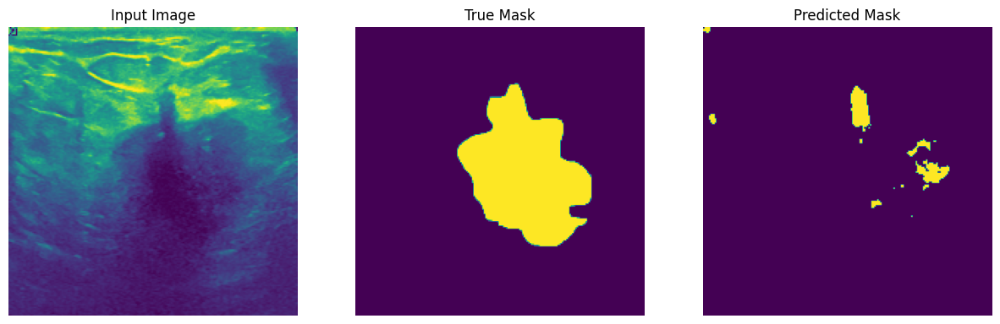

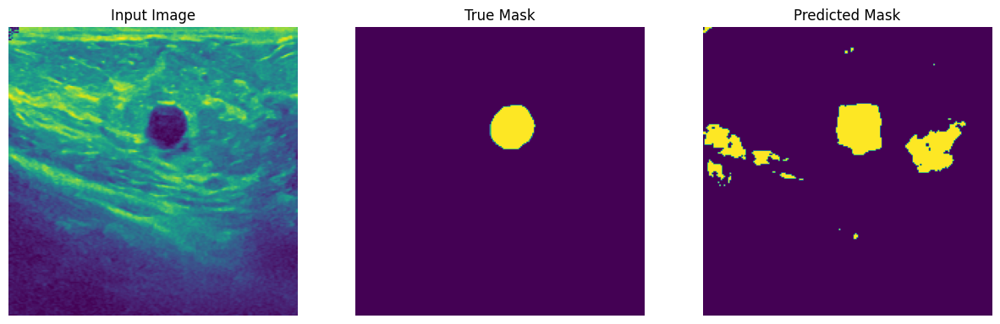

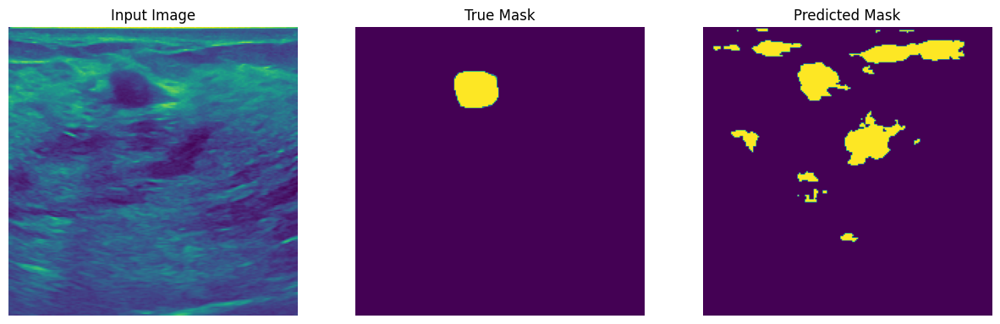

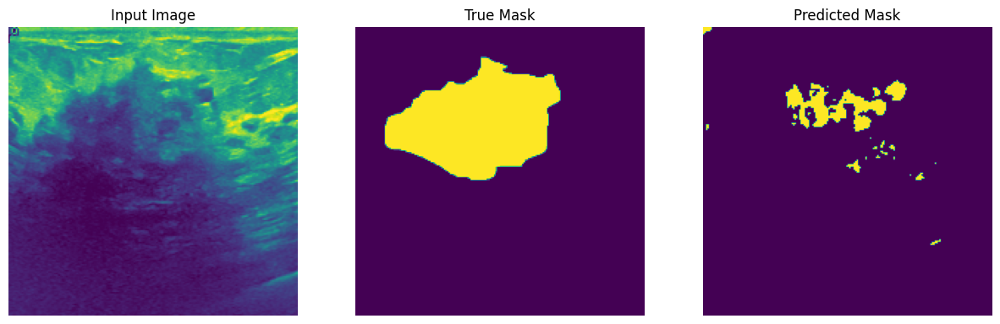

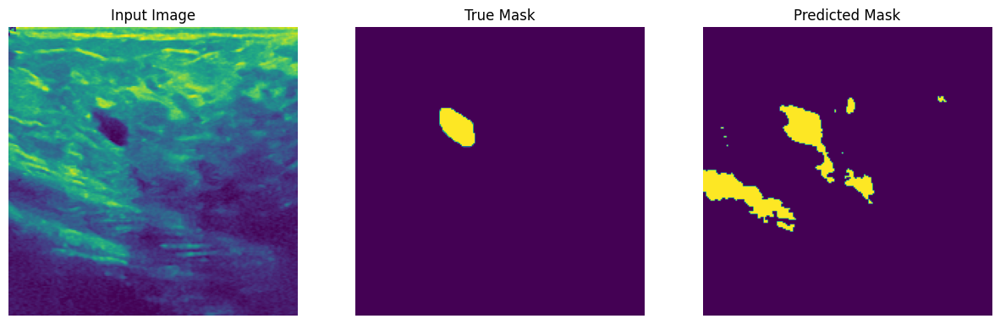

...

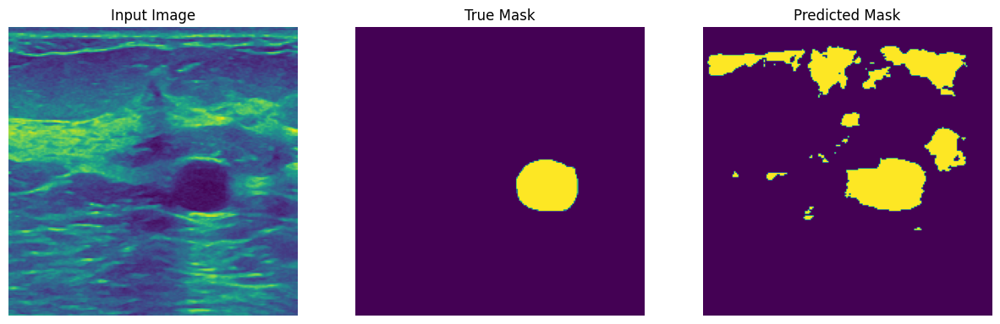

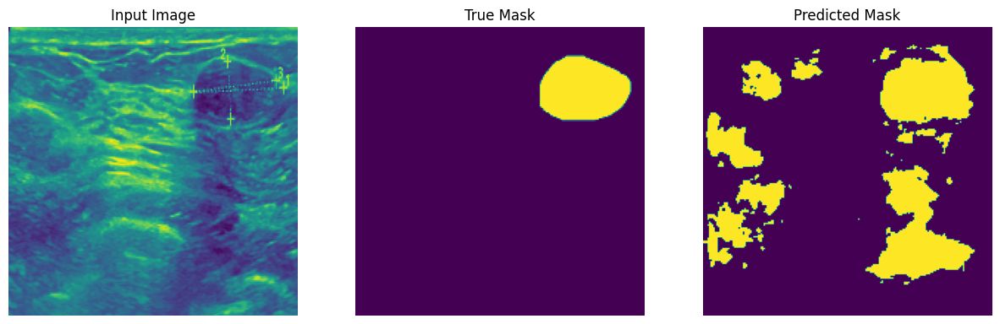

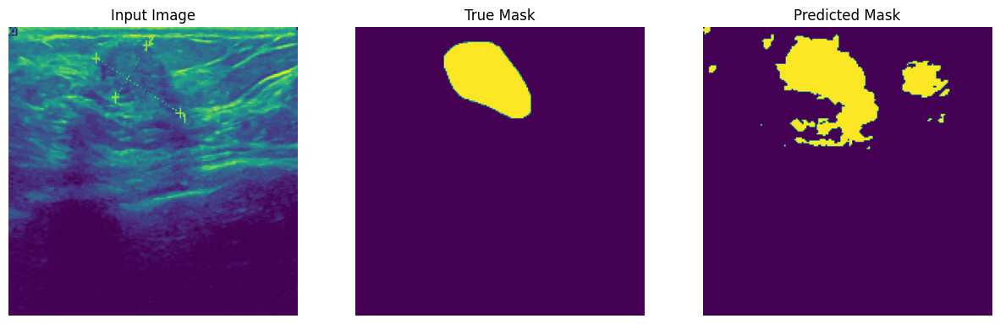

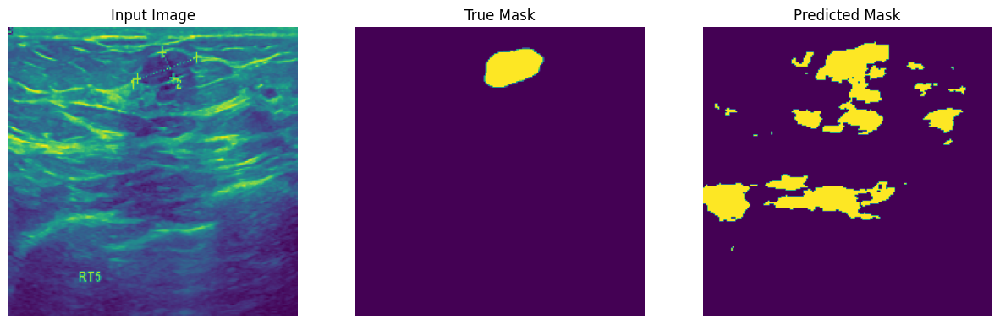

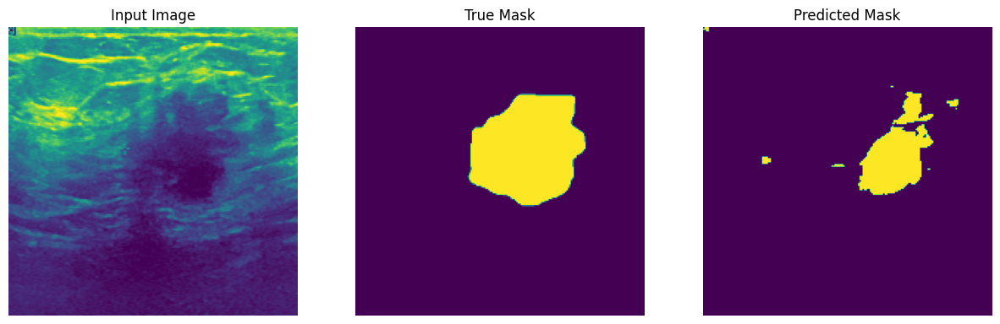

Predicted masks saved to: /kaggle/working/predicted_masks


In [49]:
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt  # For visualizing the images (optional)
import os


# 1. Get predictions on the test dataset:
predictions = model.predict(test_dataset)
predicted_masks = (predictions > 0.5).astype(np.uint8)  # Threshold at 0.5


# 3. Visualize or save the predicted masks (optional):
def display(display_list):
    plt.figure(figsize=(15, 15))
    title = ['Input Image', 'True Mask', 'Predicted Mask']
    for i in range(len(display_list)):
        plt.subplot(1, len(display_list), i+1)
        plt.title(title[i])
        plt.imshow(tf.keras.preprocessing.image.array_to_img(display_list[i]))
        plt.axis('off')
    plt.show()

for i in range(min(30, len(X_test))): # Display a few examples
    input_image = X_test[i]
    true_mask = y_test[i]
    predicted_mask = predicted_masks[i]
    display([input_image, true_mask, predicted_mask])

# 4. Save predicted mask images (if needed):
output_dir = "/kaggle/working/predicted_masks"  # Or any directory you prefer
os.makedirs(output_dir, exist_ok=True)  # Create the directory if it doesn't exist

for i in range(len(X_test)):
    predicted_mask_image = tf.keras.preprocessing.image.array_to_img(predicted_masks[i])
    predicted_mask_image.save(os.path.join(output_dir, f"predicted_mask_{i}.png"))

print(f"Predicted masks saved to: {output_dir}")

In [50]:

predictions = model.predict(test_dataset)
predicted_masks = (predictions > 0.5).astype(np.uint8)

# Output directory for combined images
combined_output_dir = "/kaggle/working/combined_images"
os.makedirs(combined_output_dir, exist_ok=True)

# Zip file path
zip_path = "/kaggle/working/gill.zip"

with zipfile.ZipFile(zip_path, 'w', zipfile.ZIP_DEFLATED) as zipf:

    for i in range(len(X_test)):
        input_image = X_test[i]
        true_mask = y_test[i]
        predicted_mask = predicted_masks[i]

        # Create a figure and combine the images horizontally
        fig, axes = plt.subplots(1, 3, figsize=(15, 5))  # Adjust figsize as needed

        axes[0].imshow(tf.keras.preprocessing.image.array_to_img(input_image))
        axes[0].set_title("Input Image")
        axes[0].axis('off')

        axes[1].imshow(tf.keras.preprocessing.image.array_to_img(true_mask), cmap='gray') # Use appropriate colormap for masks
        axes[1].set_title("True Mask")
        axes[1].axis('off')

        axes[2].imshow(tf.keras.preprocessing.image.array_to_img(predicted_mask), cmap='gray') # Use appropriate colormap for masks
        axes[2].set_title("Predicted Mask")
        axes[2].axis('off')

        # Save the combined image
        combined_image_path = os.path.join(combined_output_dir, f"combined_{i}.png")
        plt.savefig(combined_image_path) # Save the figure
        plt.close(fig) # Close the figure to free memory

        # Add to zip file
        zipf.write(combined_image_path, arcname=os.path.basename(combined_image_path))

print(f"Combined images saved and zipped to: {zip_path}")

49/49 ━━━━━━━━━━━━━━━━━━━━ 21s 434ms/step
Combined images saved and zipped to: /kaggle/working/gill.zip


In [45]:
import numpy as np
import matplotlib.pyplot as plt
import os
import cv2
import zipfile
from PIL import Image

# Get predictions on the test dataset
predictions = model.predict(test_dataset)

# Define a threshold to convert predicted probabilities to binary masks
threshold = 0.5
predicted_masks = (predictions > threshold).astype(np.uint8)  # Convert to binary (0 or 1)

# Create a directory to save the images
save_path = "predicted_images"
os.makedirs(save_path, exist_ok=True)

# Convert test dataset to numpy arrays for visualization
X_test_array = np.array(list(X_test))
y_test_array = np.array(list(y_test))

# Function to save images
def save_images(X_test, y_test, predicted_masks):
    for i in range(len(X_test)):
        original_image = (X_test[i].squeeze() * 255).astype(np.uint8)  # Scale to 0-255
        ground_truth = (y_test[i].squeeze() * 255).astype(np.uint8)
        predicted_mask = (predicted_masks[i].squeeze() * 255).astype(np.uint8)

        # Save original, ground truth, and predicted masks
        Image.fromarray(original_image).save(os.path.join(save_path, f"original_{i}.png"))
        Image.fromarray(ground_truth).save(os.path.join(save_path, f"ground_truth_{i}.png"))
        Image.fromarray(predicted_mask).save(os.path.join(save_path, f"predicted_{i}.png"))

# Save all images
save_images(X_test_array, y_test_array, predicted_masks)

# Create a ZIP file
zip_filename = "predicted_images.zip"
with zipfile.ZipFile(zip_filename, 'w', zipfile.ZIP_DEFLATED) as zipf:
    for root, _, files in os.walk(save_path):
        for file in files:
            zipf.write(os.path.join(root, file), arcname=file)

# Provide download link
print(f"All predicted images have been saved and zipped as {zip_filename}.")


49/49 ━━━━━━━━━━━━━━━━━━━━ 21s 434ms/step
All predicted images have been saved and zipped as predicted_images.zip.


In [46]:


# Get predictions on the test dataset
predictions = model.predict(test_dataset)

# Define a threshold to convert predicted probabilities to binary masks
threshold = 0.5
predicted_masks = (predictions > threshold).astype(np.uint8)  # Convert to binary (0 or 1)

# Create a directory to save the combined images
save_path = "predicted_images"
os.makedirs(save_path, exist_ok=True)

# Convert test dataset to numpy arrays for visualization
X_test_array = np.array(list(X_test))
y_test_array = np.array(list(y_test))

# Function to save images in a sequence
def save_combined_images(X_test, y_test, predicted_masks):
    for i in range(len(X_test)):
        # Convert images to 8-bit grayscale format
        original_image = (X_test[i].squeeze() * 255).astype(np.uint8)  # Scale to 0-255
        ground_truth = (y_test[i].squeeze() * 255).astype(np.uint8)
        predicted_mask = (predicted_masks[i].squeeze() * 255).astype(np.uint8)

        # Convert to PIL images
        orig_pil = Image.fromarray(original_image)
        true_pil = Image.fromarray(ground_truth)
        pred_pil = Image.fromarray(predicted_mask)

        # Combine all three images in a row
        width, height = orig_pil.size
        combined = Image.new("L", (width * 3, height))  # "L" means grayscale
        
        # Paste images side by side
        combined.paste(orig_pil, (0, 0))
        combined.paste(true_pil, (width, 0))
        combined.paste(pred_pil, (2 * width, 0))

        # Save the combined image
        combined.save(os.path.join(save_path, f"combined_{i}.png"))

# Save all combined images
save_combined_images(X_test_array, y_test_array, predicted_masks)

# Create a ZIP file
zip_filename = "predicted_images_1.zip"
with zipfile.ZipFile(zip_filename, 'w', zipfile.ZIP_DEFLATED) as zipf:
    for root, _, files in os.walk(save_path):
        for file in files:
            zipf.write(os.path.join(root, file), arcname=file)

# Provide download link
print(f"All predicted images have been saved in sequence and zipped as {zip_filename}.")


49/49 ━━━━━━━━━━━━━━━━━━━━ 21s 434ms/step
All predicted images have been saved in sequence and zipped as predicted_images_1.zip.


In [48]:
# Directory containing the predicted mask images
predicted_masks_dir = "/kaggle/working/predicted_masks"

# Path to the output zip file
zip_path = "/kaggle/working/predicted_masks_yellowcolor_111.zip"  #

# Create the zip file
with zipfile.ZipFile(zip_path, 'w', zipfile.ZIP_DEFLATED) as zipf:
    for root, _, files in os.walk(predicted_masks_dir):
        for file in files:
            file_path = os.path.join(root, file)
            zipf.write(file_path, arcname=os.path.relpath(file_path, predicted_masks_dir))

print(f"Predicted masks zipped to: {zip_path}")

Predicted masks zipped to: /kaggle/working/predicted_masks_yellowcolor_111.zip


# model one viZ

49/49 ━━━━━━━━━━━━━━━━━━━━ 22s 434ms/step


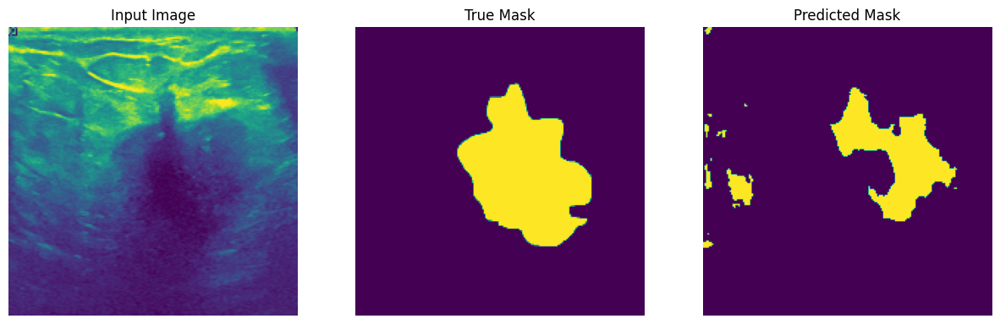

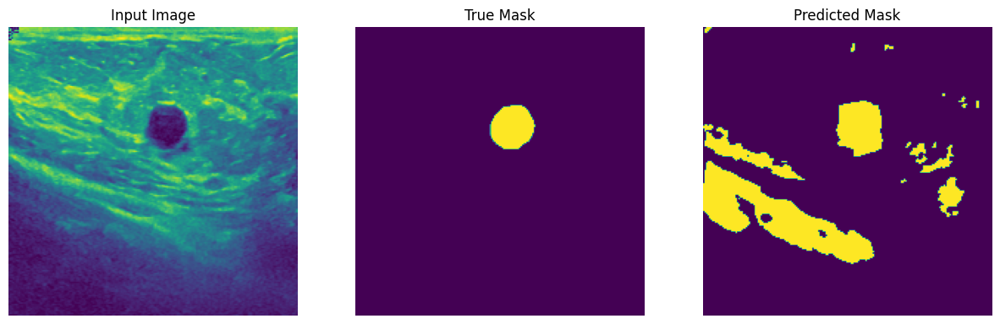

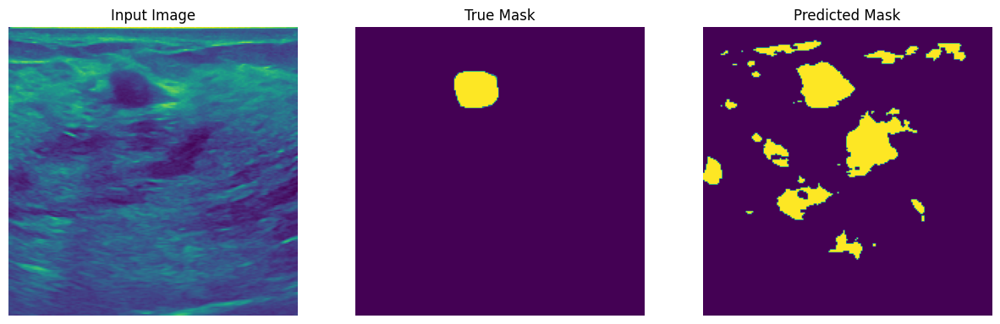

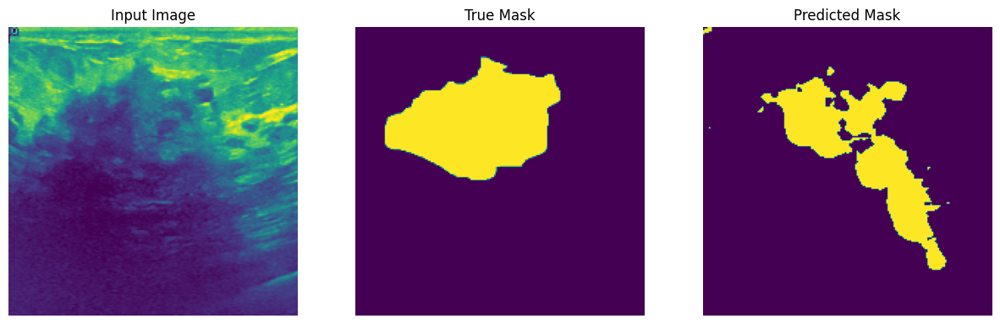

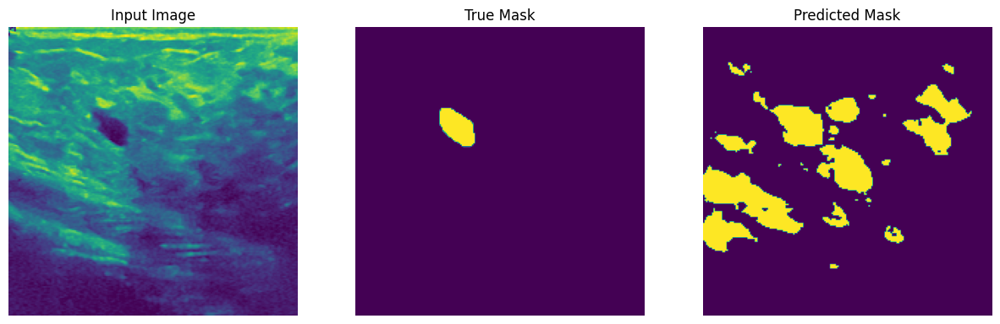

...

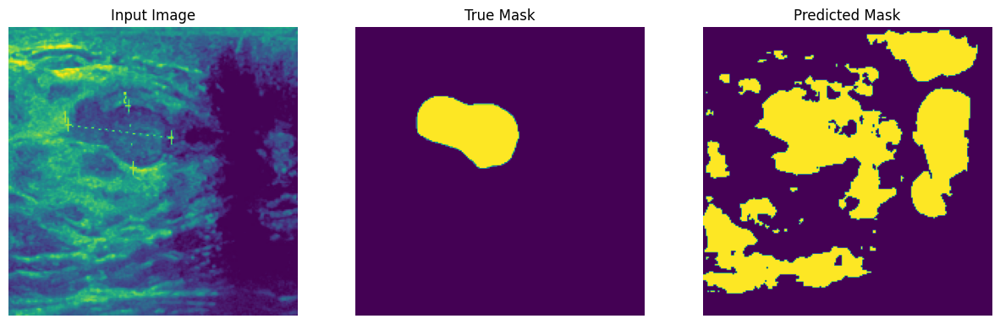

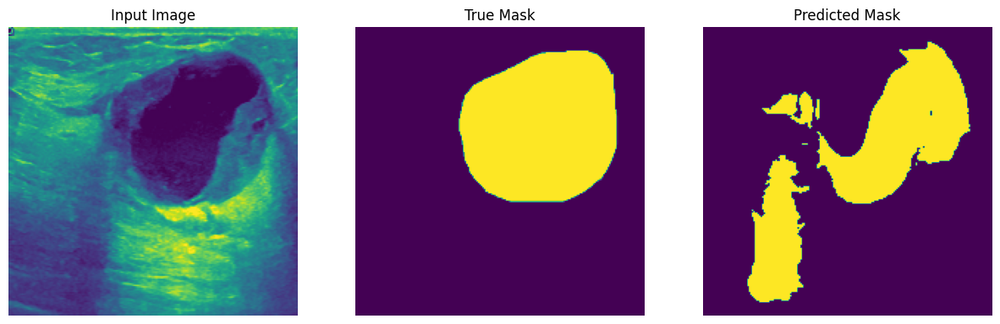

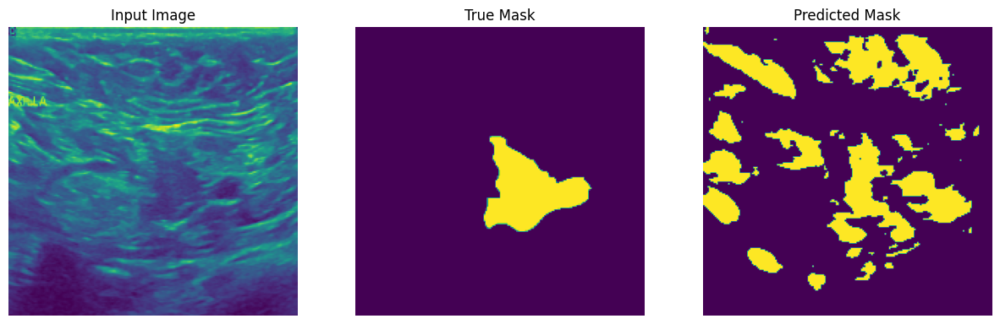

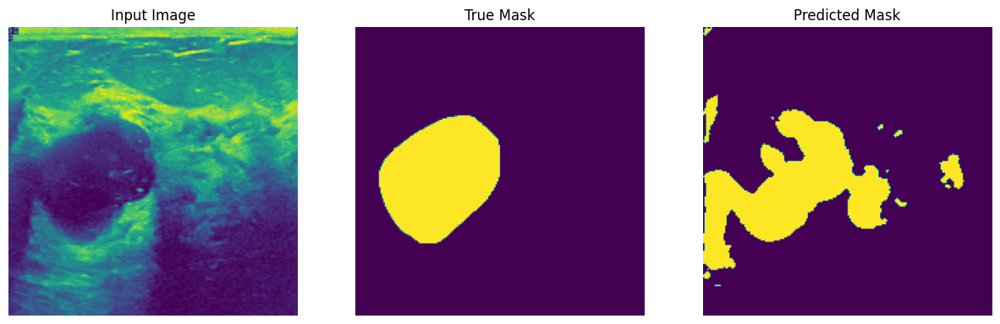

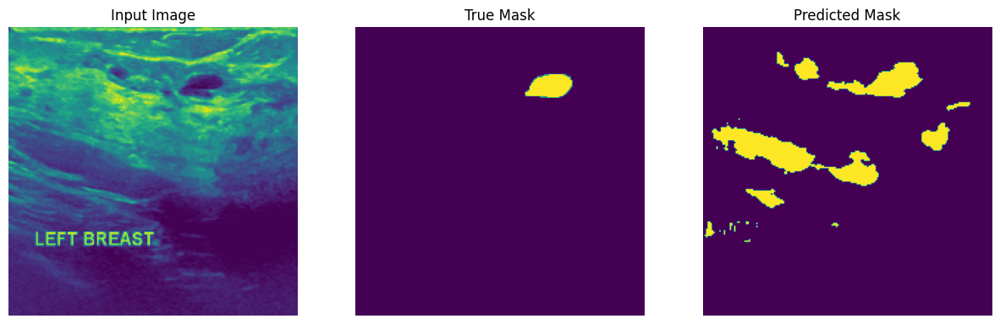

Predicted masks saved to: /kaggle/working/predicted_masks_model_one


In [51]:


# 1. Get predictions on the test dataset:
predictions = model_1.predict(test_dataset)
predicted_masks = (predictions > 0.5).astype(np.uint8)  # Threshold at 0.5


# 3. Visualize or save the predicted masks (optional):
def display(display_list):
    plt.figure(figsize=(15, 15))
    title = ['Input Image', 'True Mask', 'Predicted Mask']
    for i in range(len(display_list)):
        plt.subplot(1, len(display_list), i+1)
        plt.title(title[i])
        plt.imshow(tf.keras.preprocessing.image.array_to_img(display_list[i]))
        plt.axis('off')
    plt.show()

for i in range(min(43, len(X_test))): # Display a few examples
    input_image = X_test[i]
    true_mask = y_test[i]
    predicted_mask = predicted_masks[i]
    display([input_image, true_mask, predicted_mask])

# 4. Save predicted mask images (if needed):
output_dir = "/kaggle/working/predicted_masks_model_one"  # Or any directory you prefer
os.makedirs(output_dir, exist_ok=True)  # Create the directory if it doesn't exist

for i in range(len(X_test)):
    predicted_mask_image = tf.keras.preprocessing.image.array_to_img(predicted_masks[i])
    predicted_mask_image.save(os.path.join(output_dir, f"predicted_mask_{i}.png"))

print(f"Predicted masks saved to: {output_dir}")

In [53]:

predictions = model_1.predict(test_dataset)
predicted_masks = (predictions > 0.5).astype(np.uint8)

# Output directory for combined images
combined_output_dir = "/kaggle/working/combined_images"
os.makedirs(combined_output_dir, exist_ok=True)

# Zip file path
zip_path = "/kaggle/working/gill_model_one.zip"

with zipfile.ZipFile(zip_path, 'w', zipfile.ZIP_DEFLATED) as zipf:

    for i in range(len(X_test)):
        input_image = X_test[i]
        true_mask = y_test[i]
        predicted_mask = predicted_masks[i]

        # Create a figure and combine the images horizontally
        fig, axes = plt.subplots(1, 3, figsize=(15, 5))  # Adjust figsize as needed

        axes[0].imshow(tf.keras.preprocessing.image.array_to_img(input_image))
        axes[0].set_title("Input Image")
        axes[0].axis('off')

        axes[1].imshow(tf.keras.preprocessing.image.array_to_img(true_mask), cmap='gray') # Use appropriate colormap for masks
        axes[1].set_title("True Mask")
        axes[1].axis('off')

        axes[2].imshow(tf.keras.preprocessing.image.array_to_img(predicted_mask), cmap='gray') # Use appropriate colormap for masks
        axes[2].set_title("Predicted Mask")
        axes[2].axis('off')

        # Save the combined image
        combined_image_path = os.path.join(combined_output_dir, f"combined_{i}.png")
        plt.savefig(combined_image_path) # Save the figure
        plt.close(fig) # Close the figure to free memory

        # Add to zip file
        zipf.write(combined_image_path, arcname=os.path.basename(combined_image_path))

print(f"Combined images saved and zipped to: {zip_path}")

49/49 ━━━━━━━━━━━━━━━━━━━━ 21s 435ms/step
Combined images saved and zipped to: /kaggle/working/gill_model_one.zip


In [54]:
import numpy as np
import matplotlib.pyplot as plt
import os
import cv2
import zipfile
from PIL import Image

# Get predictions on the test dataset
predictions = model_1.predict(test_dataset)

# Define a threshold to convert predicted probabilities to binary masks
threshold = 0.5
predicted_masks = (predictions > threshold).astype(np.uint8)  # Convert to binary (0 or 1)

# Create a directory to save the images
save_path = "predicted_images"
os.makedirs(save_path, exist_ok=True)

# Convert test dataset to numpy arrays for visualization
X_test_array = np.array(list(X_test))
y_test_array = np.array(list(y_test))

# Function to save images
def save_images(X_test, y_test, predicted_masks):
    for i in range(len(X_test)):
        original_image = (X_test[i].squeeze() * 255).astype(np.uint8)  # Scale to 0-255
        ground_truth = (y_test[i].squeeze() * 255).astype(np.uint8)
        predicted_mask = (predicted_masks[i].squeeze() * 255).astype(np.uint8)

        # Save original, ground truth, and predicted masks
        Image.fromarray(original_image).save(os.path.join(save_path, f"original_{i}.png"))
        Image.fromarray(ground_truth).save(os.path.join(save_path, f"ground_truth_{i}.png"))
        Image.fromarray(predicted_mask).save(os.path.join(save_path, f"predicted_{i}.png"))

# Save all images
save_images(X_test_array, y_test_array, predicted_masks)

# Create a ZIP file
zip_filename = "predicted_images_model_one.zip"
with zipfile.ZipFile(zip_filename, 'w', zipfile.ZIP_DEFLATED) as zipf:
    for root, _, files in os.walk(save_path):
        for file in files:
            zipf.write(os.path.join(root, file), arcname=file)

# Provide download link
print(f"All predicted images have been saved and zipped as {zip_filename}.")


49/49 ━━━━━━━━━━━━━━━━━━━━ 21s 436ms/step
All predicted images have been saved and zipped as predicted_images_model_one.zip.


In [55]:


# Get predictions on the test dataset
predictions = model_1.predict(test_dataset)

# Define a threshold to convert predicted probabilities to binary masks
threshold = 0.5
predicted_masks = (predictions > threshold).astype(np.uint8)  # Convert to binary (0 or 1)

# Create a directory to save the combined images
save_path = "predicted_images"
os.makedirs(save_path, exist_ok=True)

# Convert test dataset to numpy arrays for visualization
X_test_array = np.array(list(X_test))
y_test_array = np.array(list(y_test))

# Function to save images in a sequence
def save_combined_images(X_test, y_test, predicted_masks):
    for i in range(len(X_test)):
        # Convert images to 8-bit grayscale format
        original_image = (X_test[i].squeeze() * 255).astype(np.uint8)  # Scale to 0-255
        ground_truth = (y_test[i].squeeze() * 255).astype(np.uint8)
        predicted_mask = (predicted_masks[i].squeeze() * 255).astype(np.uint8)

        # Convert to PIL images
        orig_pil = Image.fromarray(original_image)
        true_pil = Image.fromarray(ground_truth)
        pred_pil = Image.fromarray(predicted_mask)

        # Combine all three images in a row
        width, height = orig_pil.size
        combined = Image.new("L", (width * 3, height))  # "L" means grayscale
        
        # Paste images side by side
        combined.paste(orig_pil, (0, 0))
        combined.paste(true_pil, (width, 0))
        combined.paste(pred_pil, (2 * width, 0))

        # Save the combined image
        combined.save(os.path.join(save_path, f"combined_{i}.png"))

# Save all combined images
save_combined_images(X_test_array, y_test_array, predicted_masks)

# Create a ZIP file
zip_filename = "predicted_images_1_model_one.zip"
with zipfile.ZipFile(zip_filename, 'w', zipfile.ZIP_DEFLATED) as zipf:
    for root, _, files in os.walk(save_path):
        for file in files:
            zipf.write(os.path.join(root, file), arcname=file)

# Provide download link
print(f"All predicted images have been saved in sequence and zipped as {zip_filename}.")


49/49 ━━━━━━━━━━━━━━━━━━━━ 21s 437ms/step
All predicted images have been saved in sequence and zipped as predicted_images_1_model_one.zip.
